# Triangulation from two views

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/magrilu/cv-dojo/blob/main/notebooks/03-triangulation/triangulation.ipynb)

In input We have **two real images**, a few point correspondences on them, and the two camera matrices that took the pictures.

The desired output is ot have a collection of triangulated 3D point: 

$$
\boxed{(\widetilde{\mathbf m}_1,\widetilde{\mathbf m}_2,P_1,P_2)\longrightarrow \widetilde{\mathbf M}.}
$$

While a single image point does not determine a 3D point, but a whole **viewing ray**,  a second view gives a second ray, and their intersection succesfully constrains the missing depth.

The Origami House will serve as the running example. At the moment, we assume both the 2D correspondences and cameras as deliberately given: feature matching, the fundamental matrix, and camera recovery are treated separately.


In [1]:
# On Colab, fetch the repository. Locally this is a no-op.
import os, subprocess
from pathlib import Path

if "COLAB_GPU" in os.environ or "COLAB_RELEASE_TAG" in os.environ:
    if not Path("cv-dojo").is_dir():
        subprocess.run(["git", "clone", "-q", "--depth", "1",
                        "https://github.com/magrilu/cv-dojo.git"], check=True)
    os.chdir("cv-dojo")

ROOT = None
for p in [Path.cwd(), *Path.cwd().parents]:
    if (p / "data/dojo_house/annotations/triangulation.json").exists():
        ROOT = p
        break
if ROOT is None:
    raise FileNotFoundError("Could not find data/dojo_house/annotations/triangulation.json")

import json
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

plt.rcParams["figure.figsize"] = (7, 5)
plt.rcParams["axes.grid"] = False


def set_axes_equal(ax, pad=0.05):
    """Use the same physical scale on x, y, and z in a Matplotlib 3D axis."""
    limits = np.array([ax.get_xlim3d(), ax.get_ylim3d(), ax.get_zlim3d()], dtype=float)
    centers = limits.mean(axis=1)
    radius = 0.5 * np.max(limits[:, 1] - limits[:, 0]) * (1.0 + pad)
    ax.set_xlim3d(centers[0] - radius, centers[0] + radius)
    ax.set_ylim3d(centers[1] - radius, centers[1] + radius)
    ax.set_zlim3d(centers[2] - radius, centers[2] + radius)
    ax.set_box_aspect((1, 1, 1))


def skew(v):
    x, y, z = np.asarray(v, float)
    return np.array([[0, -z, y], [z, 0, -x], [-y, x, 0]])


def qvec_to_rotmat(q):
    """COLMAP quaternion [qw,qx,qy,qz] -> world-to-camera rotation."""
    w, x, y, z = np.asarray(q, float)
    return np.array([
        [1-2*y*y-2*z*z, 2*x*y-2*w*z,   2*x*z+2*w*y],
        [2*x*y+2*w*z,   1-2*x*x-2*z*z, 2*y*z-2*w*x],
        [2*x*z-2*w*y,   2*y*z+2*w*x,   1-2*x*x-2*y*y],
    ])


def dehomogenize(xh):
    xh = np.asarray(xh, float)
    return xh[..., :-1] / xh[..., -1, None]


## Two real images, with correspondences given

We use the images of the six structural vertices visible in both photographs:

$$
X_0,\;X_1,\;X_4,\;X_5,\;X_8,\;X_9.
$$

For now, treat these matches as **measurements**.


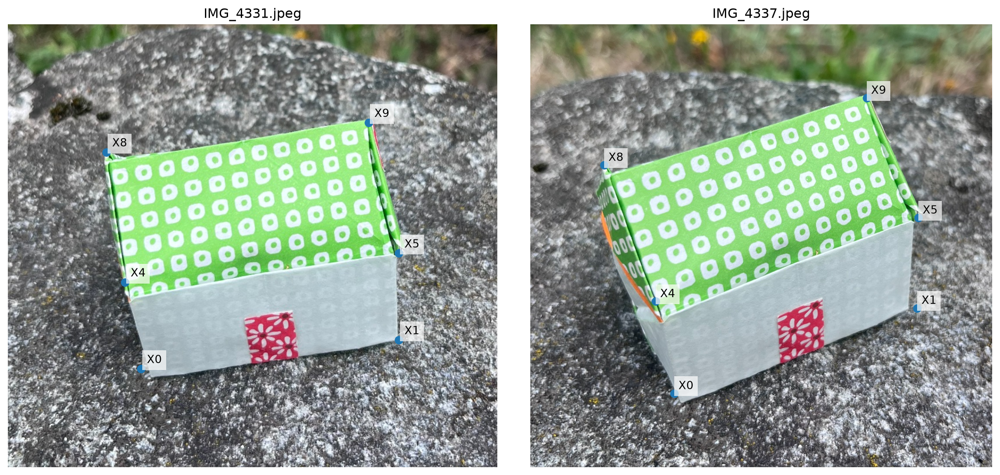

In [2]:
with open(ROOT / "data/dojo_house/annotations/triangulation.json") as f:
    data = json.load(f)

labels = data["vertices_used"]
image_names = list(data["images"])
cam = data["camera"]

f = cam["f"]
cx, cy = cam["cx"], cam["cy"]
k1 = cam["k1"]
K = np.array([[f, 0, cx], [0, f, cy], [0, 0, 1.0]])

poses = {}
obs_raw = {}
for name in image_names:
    info = data["images"][name]
    R = qvec_to_rotmat(info["qvec_wxyz"])
    t = np.asarray(info["tvec"], float)
    poses[name] = (R, t)
    obs_raw[name] = {k: np.asarray(v, float)
                     for k, v in info["observations_original_colmap_pixels"].items()}

# The displayed JPEG is a clockwise-rotated, uniformly scaled copy of
# COLMAP's original 4032x3024 pixel raster.
scale = data["display_to_colmap_mapping"]["uniform_scale"]
DISPLAY_WIDTH = 1536.0

def colmap_to_display(xy):
    x, y = np.asarray(xy, float)
    u = DISPLAY_WIDTH - y / scale
    v = x / scale
    return np.array([u, v])

fig, axes = plt.subplots(1, 2, figsize=(13, 6))
for ax, name in zip(axes, image_names):
    im = np.asarray(Image.open(ROOT / "data/dojo_house/selected" / name))
    pts = np.array([colmap_to_display(obs_raw[name][k]) for k in labels])
    ax.imshow(im)
    ax.scatter(pts[:,0], pts[:,1], s=45)
    for k, p in zip(labels, pts):
        ax.text(p[0]+10, p[1]-10, k, fontsize=10,
                bbox=dict(facecolor="white", alpha=.7, edgecolor="none"))
    pad = 170
    ax.set_xlim(max(0, pts[:,0].min()-pad), min(im.shape[1], pts[:,0].max()+pad))
    ax.set_ylim(min(im.shape[0], pts[:,1].max()+pad), max(0, pts[:,1].min()-pad))
    ax.set_title(name)
    ax.axis("off")
plt.tight_layout()
plt.show()


## From a pixel to a ray

The camera calibration lets us remove the pixel coordinate system. For an undistorted image point

$$
\widetilde{\mathbf m}=(u,v,1)^\top,
$$

its normalized camera direction is

$$
\mathbf d_c\propto K^{-1}\widetilde{\mathbf m}.
$$

With the world-to-camera convention

$$
\mathbf M_c=R\mathbf M+\mathbf t,
$$

the optical centre is

$$
\mathbf C=-R^\top\mathbf t,
$$

and the same direction expressed in the world frame is

$$
\mathbf d_w\propto R^\top\mathbf d_c.
$$

Hence one measurement defines the whole ray

$$
\boxed{\mathbf L(\alpha)=\mathbf C+\alpha\mathbf d_w,\qquad \alpha>0.}
$$


Our camera model contains a small radial distortion, so before using this equation we first undo that distortion numerically.


In [3]:
def undistort_normalized(raw_xy):
    """Invert COLMAP SIMPLE_RADIAL: xd=x(1+k r^2), yd=y(1+k r^2)."""
    xd = (raw_xy[0] - cx) / f
    yd = (raw_xy[1] - cy) / f
    x, y = xd, yd
    for _ in range(12):
        fac = 1.0 + k1 * (x*x + y*y)
        x, y = xd / fac, yd / fac
    return np.array([x, y])


def camera_center(R, t):
    return -R.T @ t


def ray_from_observation(name, raw_xy):
    R, t = poses[name]
    x, y = undistort_normalized(raw_xy)
    dc = np.array([x, y, 1.0])
    dw = R.T @ dc
    dw /= np.linalg.norm(dw)
    return camera_center(R, t), dw

# Inspect one correspondence numerically.
label = "X9"
for name in image_names:
    C, d = ray_from_observation(name, obs_raw[name][label])
    print(name)
    print("  camera centre =", np.round(C, 4))
    print("  ray direction =", np.round(d, 4))


IMG_4331.jpeg
  camera centre = [ 0.3538  1.0384 -0.1626]
  ray direction = [ 0.4991 -0.6573  0.5647]
IMG_4337.jpeg
  camera centre = [0.5942 0.8603 0.8572]
  ray direction = [ 0.551  -0.7878  0.2752]


## Triangulation with DLT

For one camera we have

$$
\lambda\widetilde{\mathbf x}=P\widetilde{\mathbf M},
$$

where here $\widetilde{\mathbf x}=(x,y,1)^\top$ is an **undistorted normalized** image point and, because calibration has already been removed,

$$
P=[R\mid\mathbf t].
$$

The unknown scale $\lambda$ disappears if we take the cross product:

$$
\widetilde{\mathbf x}\times P\widetilde{\mathbf M}=0.
$$

Equivalently,

$$
[\widetilde{\mathbf x}]_\times P\widetilde{\mathbf M}=0,
$$

with

$$
[\widetilde{\mathbf x}]_\times=
\begin{bmatrix}
0 & -1 & y\\
1 & 0 & -x\\
-y & x & 0
\end{bmatrix}.
$$

### Why do we keep only two equations per view?

The cross product gives three scalar equations, but the skew-symmetric matrix $[\widetilde{\mathbf x}]_\times$ has rank two for every non-zero image point:

$$
\operatorname{rank}([\widetilde{\mathbf x}]_\times)=2,
\qquad
[\widetilde{\mathbf x}]_\times\widetilde{\mathbf x}=0.
$$

Its nullspace is therefore the one-dimensional subspace spanned by $\widetilde{\mathbf x}$. Consequently $[\widetilde{\mathbf x}]_\times P\widetilde{\mathbf M}=0$ can provide at most **two independent constraints**.

There is also a useful Kronecker-product form of the same incidence equation. Using $\operatorname{vec}(APB)=(B^\top\otimes A)\operatorname{vec}(P)$,

$$
[\widetilde{\mathbf x}]_\times P\widetilde{\mathbf M}
=
\left(\widetilde{\mathbf M}^{\top}\otimes[\widetilde{\mathbf x}]_\times\right)\operatorname{vec}(P)=0.
$$

We do **not** solve this form here because $P$ is given and $\widetilde{\mathbf M}$ is the unknown. It is nevertheless the same projective incidence constraint, and its rank-two structure explains again why one image contributes only two independent scalar equations.

Writing the rows of $P$ as $P_1^\top,P_2^\top,P_3^\top$, two convenient independent equations are

$$
(xP_3^\top-P_1^\top)\widetilde{\mathbf M}=0,
$$

$$
(yP_3^\top-P_2^\top)\widetilde{\mathbf M}=0.
$$

Two views therefore give four equations in the four homogeneous coordinates of the 3D point:

$$
A\widetilde{\mathbf M}=0,
$$

with

$$
A=
\begin{bmatrix}
 x_1P_{13}^\top-P_{11}^\top\\
 y_1P_{13}^\top-P_{12}^\top\\
 x_2P_{23}^\top-P_{21}^\top\\
 y_2P_{23}^\top-P_{22}^\top
\end{bmatrix}.
$$

With real measurements the equations are not perfectly compatible. DLT chooses the unit vector $\widetilde{\mathbf M}$ that minimizes $\|A\widetilde{\mathbf M}\|$: the last right singular vector of $A$.

The result is a **homogeneous vector**. We must dehomogenize it before plotting the 3D point.


In [4]:
def triangulate_dlt(P1, P2, x1, x2):
    """Linear two-view triangulation from normalized image coordinates."""
    x1, y1 = np.asarray(x1, float)
    x2, y2 = np.asarray(x2, float)
    A = np.vstack([
        x1 * P1[2] - P1[0],
        y1 * P1[2] - P1[1],
        x2 * P2[2] - P2[0],
        y2 * P2[2] - P2[1],
    ])
    _, _, Vt = np.linalg.svd(A)
    Xh = Vt[-1]
    return Xh / Xh[-1], A

name1, name2 = image_names
R1, t1 = poses[name1]
R2, t2 = poses[name2]
P1 = np.c_[R1, t1]
P2 = np.c_[R2, t2]

X_world = {}
for k in labels:
    x1 = undistort_normalized(obs_raw[name1][k])
    x2 = undistort_normalized(obs_raw[name2][k])
    Xh, A = triangulate_dlt(P1, P2, x1, x2)
    X_world[k] = Xh[:3]

print("One reconstructed homogeneous point:")
print("X9 ~", np.round(np.r_[X_world['X9'], 1.0], 5))


One reconstructed homogeneous point:
X9 ~ [ 1.78093 -0.83885  1.45064  1.     ]


### Put the reconstruction in a readable Euclidean frame

The coordinate frame produced by the triangulation is arbitrary. Before plotting, we attach a new **Euclidean reference frame to the reconstructed house**:

- origin at $X_0$;
- $x$ axis along the recovered edge $X_0X_1$;
- $z$ axis from the average direction of the two recovered wall edges;
- $y$ completes a right-handed orthonormal frame and points toward the roof.

This is only a rigid change of coordinates. It does **not** alter distances or angles, and it does not use the ideal house to straighten the reconstruction.


In [5]:
def house_frame(Xdict):
    O = Xdict["X0"]
    ex = Xdict["X1"] - O
    ex /= np.linalg.norm(ex)

    z_hint = 0.5 * ((Xdict["X4"] - Xdict["X0"]) +
                    (Xdict["X5"] - Xdict["X1"]))
    z_hint -= ex * (ex @ z_hint)
    ez = z_hint / np.linalg.norm(z_hint)
    ey = np.cross(ez, ex)
    ey /= np.linalg.norm(ey)

    roof = 0.5 * (Xdict["X8"] + Xdict["X9"])
    eaves = 0.5 * (Xdict["X4"] + Xdict["X5"])
    if (roof - eaves) @ ey < 0:
        ey = -ey
    ez = np.cross(ex, ey)
    ez /= np.linalg.norm(ez)

    B = np.vstack([ex, ey, ez])  # world -> house axes
    T = np.eye(4)
    T[:3,:3] = B
    T[:3,3] = -B @ O
    return T

T_house = house_frame(X_world)
Tinv = np.linalg.inv(T_house)

X_house = {k: dehomogenize(T_house @ np.r_[X,1.0]) for k, X in X_world.items()}
P1_house = P1 @ Tinv
P2_house = P2 @ Tinv

# Verify that the SAME DLT now reconstructs directly in the house frame.
X_house_dlt = {}
for k in labels:
    x1 = undistort_normalized(obs_raw[name1][k])
    x2 = undistort_normalized(obs_raw[name2][k])
    Xh, _ = triangulate_dlt(P1_house, P2_house, x1, x2)
    X_house_dlt[k] = Xh[:3]

print("max coordinate difference after changing Euclidean frame:",
      max(np.linalg.norm(X_house[k]-X_house_dlt[k]) for k in labels))


max coordinate difference after changing Euclidean frame: 0.00015282983689467126


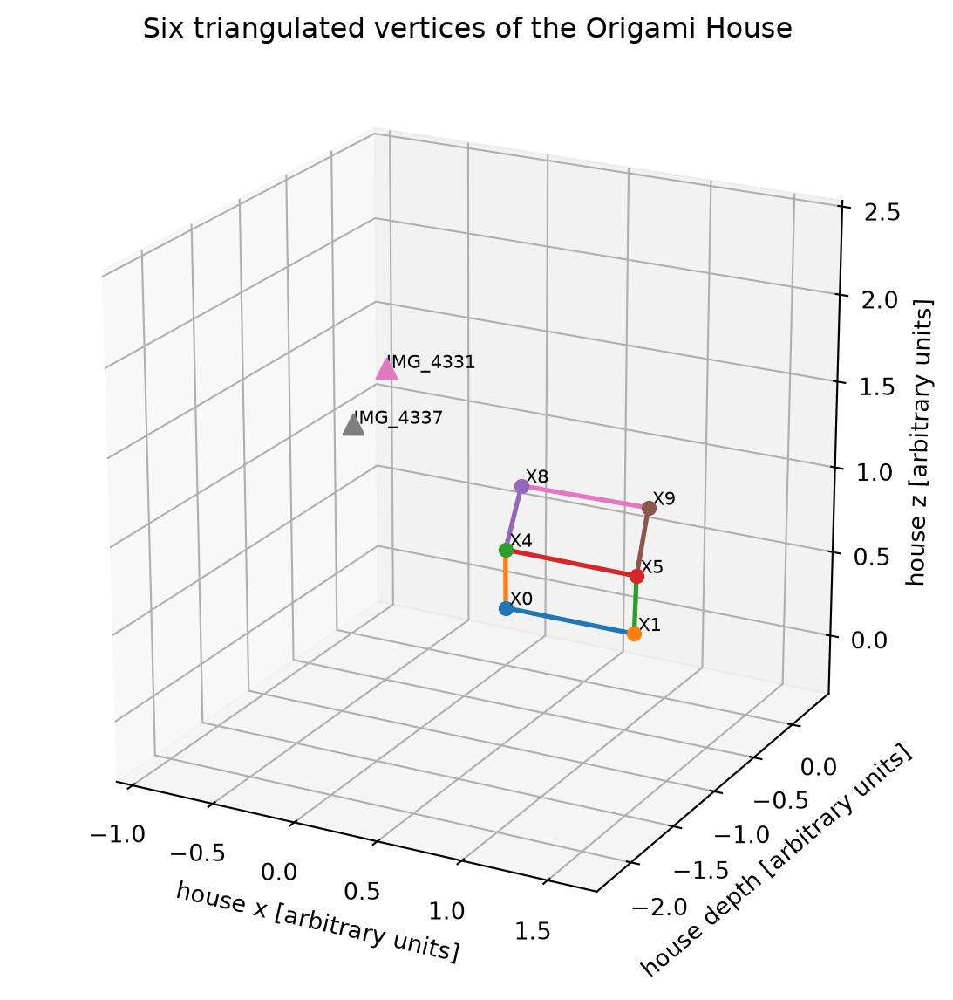

In [6]:
front_edges = [
    ("X0","X1"), ("X0","X4"), ("X1","X5"), ("X4","X5"),
    ("X4","X8"), ("X5","X9"), ("X8","X9")
]

def draw_reconstruction(ax, Xdict, edges=front_edges, labels_on=True, lw=2):
    for a,b in edges:
        q = np.vstack([Xdict[a], Xdict[b]])
        ax.plot(q[:,0], q[:,1], q[:,2], lw=lw)
    for k,p in Xdict.items():
        ax.scatter(*p, s=30)
        if labels_on:
            ax.text(*(p + np.array([.015,.015,.015])), k, fontsize=8)

# Transform camera centres to the same house frame.
def transform_point(T, X):
    return dehomogenize(T @ np.r_[X,1.0])

C1h = transform_point(T_house, camera_center(R1,t1))
C2h = transform_point(T_house, camera_center(R2,t2))

fig = plt.figure(figsize=(9,7))
ax = fig.add_subplot(111, projection='3d')
draw_reconstruction(ax, X_house)
ax.scatter(*C1h, marker='^', s=75)
ax.scatter(*C2h, marker='^', s=75)
ax.text(*C1h, name1.replace('.jpeg',''), fontsize=8)
ax.text(*C2h, name2.replace('.jpeg',''), fontsize=8)
ax.set_xlabel('house x [arbitrary units]')
ax.set_ylabel('house depth [arbitrary units]')
ax.set_zlabel('house z [arbitrary units]')
ax.set_title('Six triangulated vertices of the Origami House')
ax.view_init(elev=21, azim=-62)
set_axes_equal(ax)
plt.show()


## What geometry did DLT reconstruct?

DLT itself does not know what a metre, a right angle, or a rigid motion is. It reconstructs points in the **3D projective coordinate system encoded by the camera matrices**.

Our matrices $P_1$ and $P_2$ came from calibrated cameras and Euclidean poses, so their 3D coordinates carry Euclidean geometry (up to the global scale left undetermined by SfM).

But consider any invertible $4\times4$ projective transformation $H$. Define

$$
\widetilde{\mathbf M}'=H\widetilde{\mathbf M},
\qquad
P_i'=P_iH^{-1}.
$$

Then

$$
P_i'\widetilde{\mathbf M}'
=P_iH^{-1}H\widetilde{\mathbf M}
=P_i\widetilde{\mathbf M}.
$$

The **image points are unchanged**, even though the 3D house may be strongly distorted.

This is the projective ambiguity in its simplest form. We are not yet recovering projective cameras from a fundamental matrix; that belongs to two-view geometry. Here the cameras are still given — we simply express them in a different 3D projective frame.


max difference: DLT in projective frame vs H X = 0.0003162058124405462


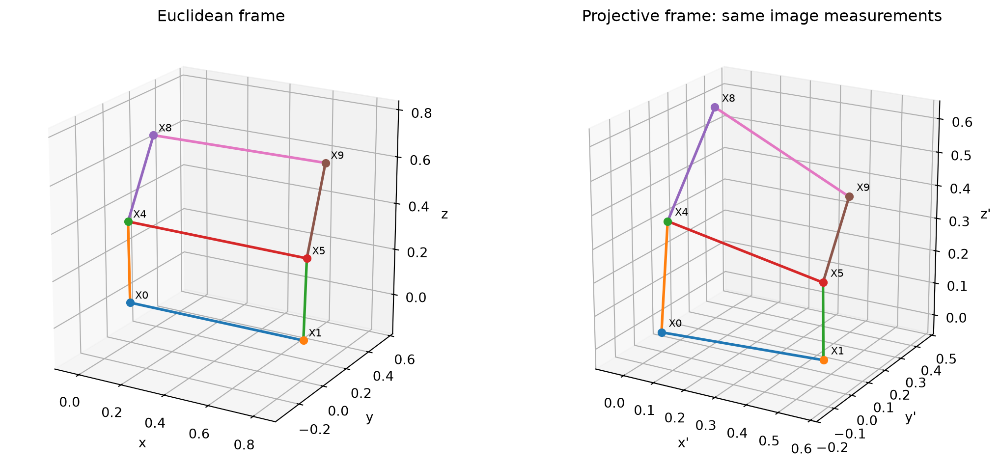

In [7]:
# A genuine projective transformation: the last row depends on x,y,z,
# so this is not an affine map or a similarity.
H = np.array([
    [1.00,  0.10, 0.00, 0.00],
    [0.00,  1.00, 0.15, 0.00],
    [0.05,  0.00, 1.00, 0.00],
    [0.65, -0.20, 0.25, 1.00],
])

P1_proj = P1_house @ np.linalg.inv(H)
P2_proj = P2_house @ np.linalg.inv(H)

X_proj = {}
for k in labels:
    x1 = undistort_normalized(obs_raw[name1][k])
    x2 = undistort_normalized(obs_raw[name2][k])
    Xh, _ = triangulate_dlt(P1_proj, P2_proj, x1, x2)
    X_proj[k] = Xh[:3]

# Directly transform the Euclidean reconstruction to check the identity X' ~ H X.
X_proj_direct = {
    k: dehomogenize(H @ np.r_[X_house[k], 1.0])
    for k in labels
}
print("max difference: DLT in projective frame vs H X =",
      max(np.linalg.norm(X_proj[k]-X_proj_direct[k]) for k in labels))

fig = plt.figure(figsize=(12,5))
ax = fig.add_subplot(121, projection='3d')
draw_reconstruction(ax, X_house)
ax.set_title('Euclidean frame')
ax.set_xlabel('x'); ax.set_ylabel('y'); ax.set_zlabel('z')
ax.view_init(elev=20, azim=-60)
set_axes_equal(ax)

ax = fig.add_subplot(122, projection='3d')
draw_reconstruction(ax, X_proj)
ax.set_title('Projective frame: same image measurements')
ax.set_xlabel("x'"); ax.set_ylabel("y'"); ax.set_zlabel("z'")
ax.view_init(elev=20, azim=-60)
set_axes_equal(ax)
plt.tight_layout()
plt.show()


### The image really does not change

The identity above is exact, so we can check it directly on the photographs. In the first row we project the Euclidean reconstruction with $(P_1,P_2)$. In the second row we first transform the 3D points by $H$ and the cameras by $H^{-1}$, and then project again.

The two rows should be visually indistinguishable: the 3D house has changed, but the image points have not.


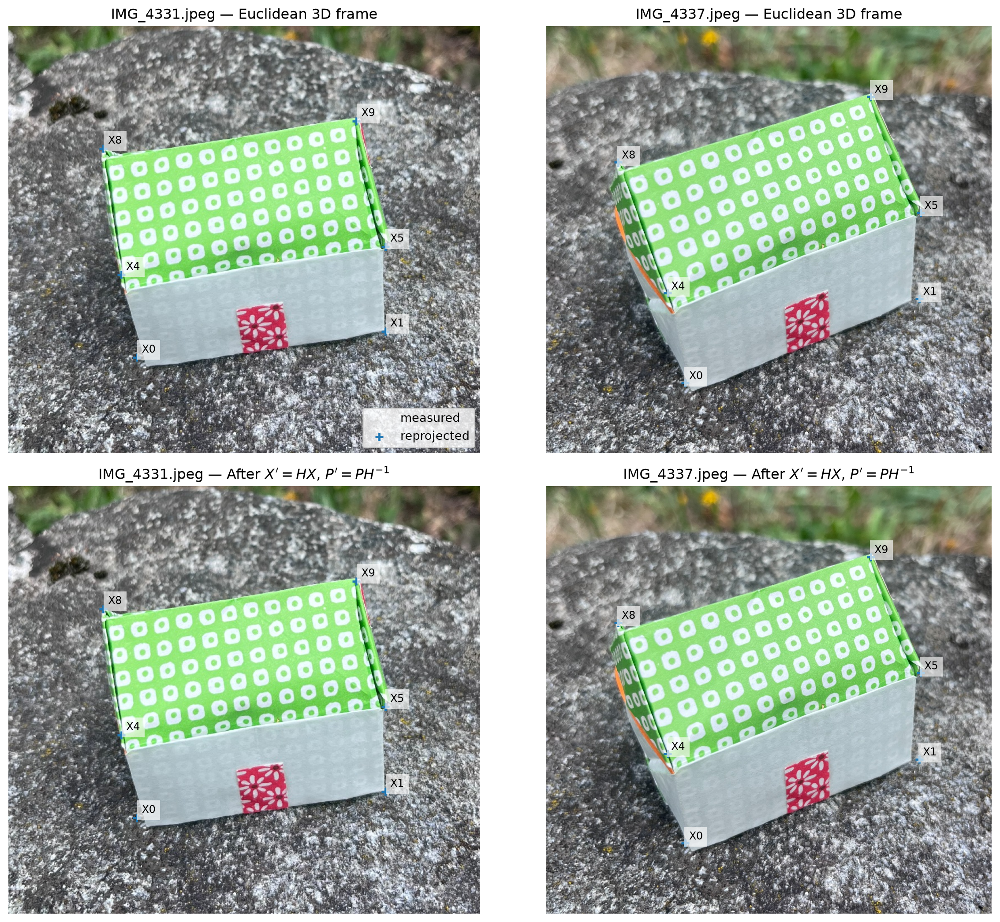

maximum difference between the two predicted image locations: 3.216e-13 px


In [8]:
def distort_to_raw(xy):
    """COLMAP SIMPLE_RADIAL: normalized undistorted -> original raw pixels."""
    x, y = np.asarray(xy, float)
    fac = 1.0 + k1 * (x*x + y*y)
    return np.array([f*x*fac + cx, f*y*fac + cy])


def project_to_display(P, X):
    q = P @ np.r_[X, 1.0]
    xy = q[:2] / q[2]
    return colmap_to_display(distort_to_raw(xy))

P_house = [P1_house, P2_house]
P_projective = [P1_proj, P2_proj]

max_same_pixel = 0.0
fig, axes = plt.subplots(2, 2, figsize=(13, 11))

for j, name in enumerate(image_names):
    im = np.asarray(Image.open(ROOT / "data/dojo_house/selected" / name))
    measured = np.array([colmap_to_display(obs_raw[name][k]) for k in labels])
    projected_e = np.array([project_to_display(P_house[j], X_house[k]) for k in labels])
    projected_h = np.array([project_to_display(P_projective[j], X_proj_direct[k]) for k in labels])

    max_same_pixel = max(max_same_pixel,
                         np.max(np.linalg.norm(projected_e - projected_h, axis=1)))

    for row, (pred, row_title) in enumerate([
        (projected_e, "Euclidean 3D frame"),
        (projected_h, "After $X'=HX$, $P'=PH^{-1}$"),
    ]):
        ax = axes[row, j]
        ax.imshow(im)
        ax.scatter(measured[:,0], measured[:,1], s=55, marker='o',
                   facecolors='none', linewidths=1.5, label='measured')
        ax.scatter(pred[:,0], pred[:,1], s=50, marker='+',
                   linewidths=1.8, label='reprojected')
        for k, p in zip(labels, pred):
            ax.text(p[0]+9, p[1]-9, k, fontsize=9,
                    bbox=dict(facecolor='white', alpha=.65, edgecolor='none'))
        pad = 170
        ax.set_xlim(max(0, measured[:,0].min()-pad), min(im.shape[1], measured[:,0].max()+pad))
        ax.set_ylim(min(im.shape[0], measured[:,1].max()+pad), max(0, measured[:,1].min()-pad))
        ax.set_title(f"{name} — {row_title}")
        ax.axis('off')
        if row == 0 and j == 0:
            ax.legend(loc='lower right')

plt.tight_layout()
plt.show()

print(f"maximum difference between the two predicted image locations: {max_same_pixel:.3e} px")


The two 3D plots are different shapes, while the two rows of image projections are the same. Numerically the predicted pixels agree up to floating-point precision.

This is worth keeping separate from the numerical method:

$$
\boxed{\text{DLT is projective. The geometry comes from the cameras.}}
$$

With calibrated Euclidean cameras, the reconstruction is Euclidean up to a global similarity. With arbitrary projective cameras, the reconstruction is only projective.


## Real rays do not intersect exactly

With perfect cameras and noiseless correspondences, the two optical rays of a 3D point intersect at exactly one point.

Real measurements are different. A fraction of a pixel of localization error is enough to make the two reconstructed rays **skew** in 3D. There is then no exact intersection.

One very intuitive construction is **midpoint triangulation**:

1. find the closest point $Q_1$ on the first ray and $Q_2$ on the second ray;
2. take the midpoint of the shortest segment joining the rays,

$$
\boxed{\mathbf M_{\rm mid}=\frac{Q_1+Q_2}{2}.}
$$

This is not what DLT does. Midpoint triangulation minimizes a Euclidean distance between rays; DLT minimizes an algebraic residual. A third possibility is to optimize the reprojection error directly.

To see the geometry cleanly, we now leave the photographs and use a controlled synthetic experiment. We deliberately exaggerate the image perturbation in the first plot so that the short segment between the skew rays is visible.


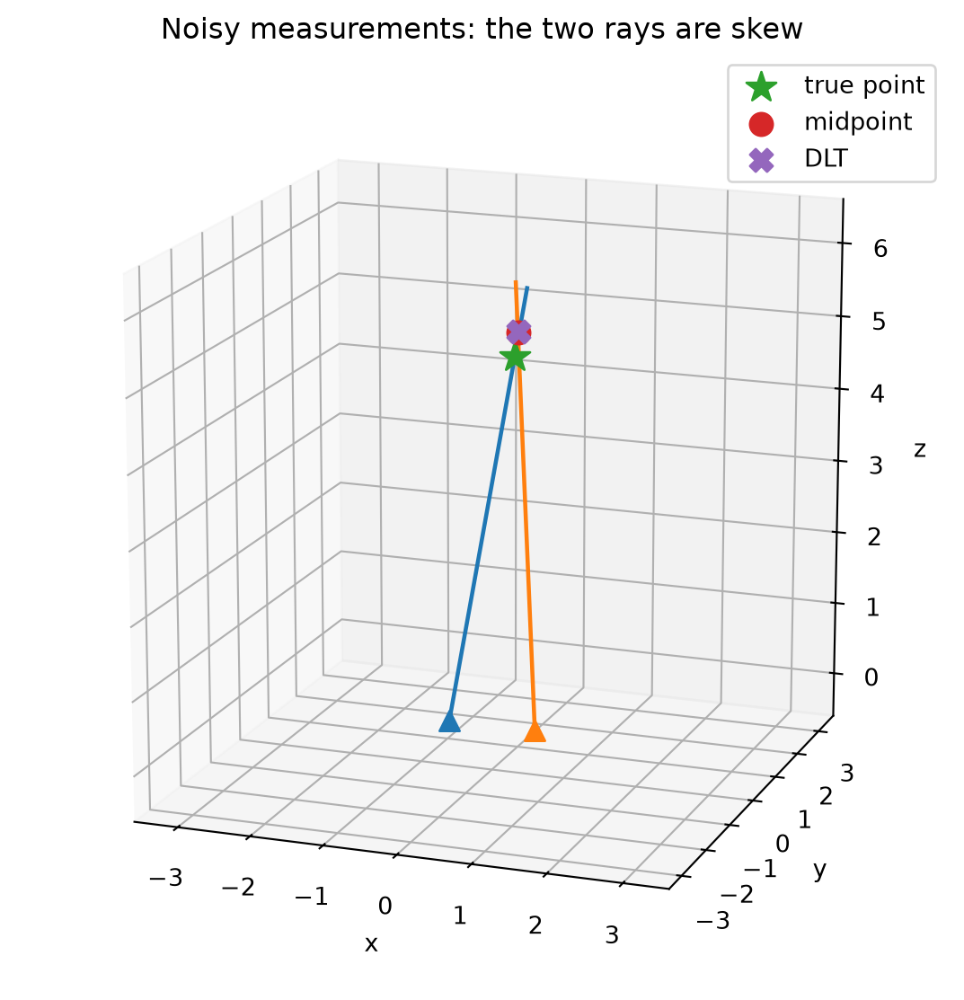

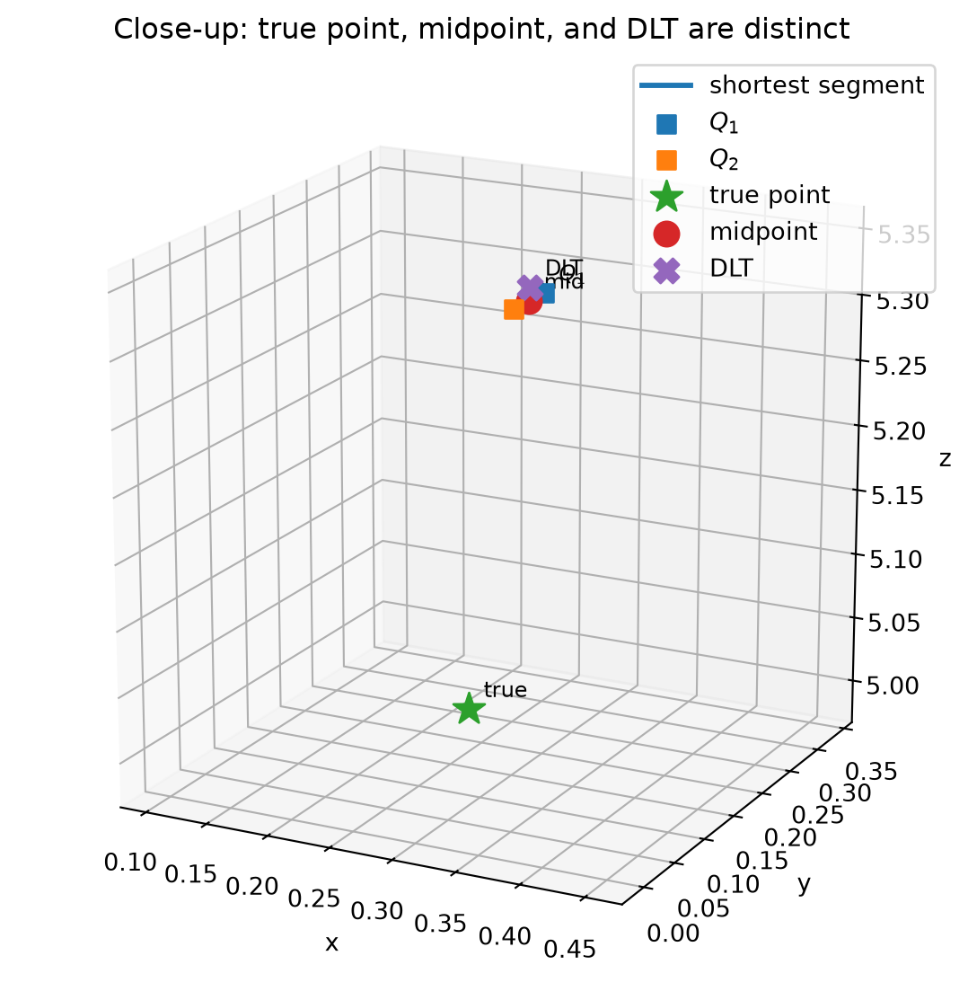

true point      [0.25 0.18 5.  ]
midpoint        [0.306  0.165  5.3232] 3D error = 0.32837
DLT             [0.3067 0.1653 5.333 ] 3D error = 0.33808
midpoint-DLT distance = 0.00979


In [9]:
def midpoint_triangulation(C1, d1, C2, d2):
    """Midpoint of the shortest segment between two 3D lines."""
    d1 = np.asarray(d1, float); d1 /= np.linalg.norm(d1)
    d2 = np.asarray(d2, float); d2 /= np.linalg.norm(d2)
    A = np.array([[d1@d1, -(d1@d2)],
                  [d1@d2, -(d2@d2)]], float)
    b = np.array([d1@(C2-C1), d2@(C2-C1)], float)
    a, bpar = np.linalg.solve(A, b)
    Q1 = C1 + a*d1
    Q2 = C2 + bpar*d2
    return 0.5*(Q1+Q2), Q1, Q2


def project_normalized(P, X):
    q = P @ np.r_[X,1.0]
    return q[:2] / q[2]

# Parallel synthetic cameras in normalized coordinates.
baseline = 1.2
C1 = np.array([-baseline/2, 0.0, 0.0])
C2 = np.array([ baseline/2, 0.0, 0.0])
R = np.eye(3)
P1s = np.c_[R, -R@C1]
P2s = np.c_[R, -R@C2]
Xtrue = np.array([0.25, 0.18, 5.0])

x1 = project_normalized(P1s, Xtrue)
x2 = project_normalized(P2s, Xtrue)

# Deliberately use a visible perturbation here; the next experiment returns to 1 px.
noise_px = np.array([12.0, -8.0])
f_virtual = 800.0
x2_noisy = x2 + noise_px/f_virtual

Xdlt_h, _ = triangulate_dlt(P1s, P2s, x1, x2_noisy)
Xdlt = Xdlt_h[:3]

d1 = np.r_[x1,1.0]; d1 /= np.linalg.norm(d1)
d2 = np.r_[x2_noisy,1.0]; d2 /= np.linalg.norm(d2)
Xmid, Q1, Q2 = midpoint_triangulation(C1,d1,C2,d2)

# First: the whole ray geometry.
fig = plt.figure(figsize=(9,7))
ax = fig.add_subplot(111, projection='3d')
for C,d in [(C1,d1),(C2,d2)]:
    L = np.vstack([C, C + 6.0*d])
    ax.plot(L[:,0],L[:,1],L[:,2],lw=1.7)
    ax.scatter(*C, marker='^', s=70)
ax.plot([Q1[0],Q2[0]],[Q1[1],Q2[1]],[Q1[2],Q2[2]],lw=2.2)
ax.scatter(*Xtrue, marker='*', s=170, label='true point')
ax.scatter(*Xmid, marker='o', s=90, label='midpoint')
ax.scatter(*Xdlt, marker='X', s=90, label='DLT')
ax.set_xlabel('x'); ax.set_ylabel('y'); ax.set_zlabel('z')
ax.set_title('Noisy measurements: the two rays are skew')
ax.legend()
ax.view_init(elev=16, azim=-70)
set_axes_equal(ax)
plt.show()

# Second: zoom into the reconstructed region so the three estimates can be read.
focus = np.vstack([Xtrue, Xmid, Xdlt, Q1, Q2])
centre = 0.5 * (focus.min(axis=0) + focus.max(axis=0))
radius = 0.60 * np.max(focus.max(axis=0) - focus.min(axis=0))

fig = plt.figure(figsize=(8,7))
ax = fig.add_subplot(111, projection='3d')
ax.plot([Q1[0],Q2[0]],[Q1[1],Q2[1]],[Q1[2],Q2[2]],lw=2.2, label='shortest segment')
ax.scatter(*Q1, marker='s', s=55, label='$Q_1$')
ax.scatter(*Q2, marker='s', s=55, label='$Q_2$')
ax.scatter(*Xtrue, marker='*', s=190, label='true point')
ax.scatter(*Xmid, marker='o', s=105, label='midpoint')
ax.scatter(*Xdlt, marker='X', s=105, label='DLT')

for txt, p in [('true',Xtrue),('mid',Xmid),('DLT',Xdlt),('$Q_1$',Q1),('$Q_2$',Q2)]:
    ax.text(*(p + np.array([0.008,0.008,0.008])), txt, fontsize=9)

ax.set_xlim(centre[0]-radius, centre[0]+radius)
ax.set_ylim(centre[1]-radius, centre[1]+radius)
ax.set_zlim(centre[2]-radius, centre[2]+radius)
ax.set_box_aspect((1,1,1))
ax.set_xlabel('x'); ax.set_ylabel('y'); ax.set_zlabel('z')
ax.set_title('Close-up: true point, midpoint, and DLT are distinct')
ax.view_init(elev=18, azim=-63)
ax.legend(loc='best')
plt.show()

print('true point     ', np.round(Xtrue,4))
print('midpoint       ', np.round(Xmid,4), '3D error =', round(np.linalg.norm(Xmid-Xtrue),5))
print('DLT            ', np.round(Xdlt,4), '3D error =', round(np.linalg.norm(Xdlt-Xtrue),5))
print('midpoint-DLT distance =', round(np.linalg.norm(Xmid-Xdlt),5))


### Reprojection error

The image measurements are what we actually observed, so a natural geometric criterion is the **reprojection error**:

$$
E(\mathbf M)=
\sum_i
\left\|
\mathbf x_i-\pi(P_i\widetilde{\mathbf M})
\right\|^2.
$$

Neither linear DLT nor midpoint triangulation is, in general, the minimizer of this nonlinear objective. DLT is nevertheless an excellent initialization: simple, fast, and often already accurate when the geometry is well conditioned.


In [10]:
def reprojection_error_normalized(Ps, xs, X):
    err = []
    for P,x in zip(Ps,xs):
        xp = project_normalized(P,X)
        err.append(np.linalg.norm(xp-x))
    return np.array(err)

for name, Xest in [('midpoint',Xmid),('DLT',Xdlt)]:
    e = reprojection_error_normalized([P1s,P2s],[x1,x2_noisy],Xest) * f_virtual
    print(f'{name:9s}: per-view reprojection error = {np.round(e,3)} px, RMS = {np.sqrt(np.mean(e**2)):.3f} px')


midpoint : per-view reprojection error = [4.004 4.004] px, RMS = 4.004 px
DLT      : per-view reprojection error = [3.999 4.001] px, RMS = 4.000 px


## Conditioning: triangulation angle matters

Triangulation becomes fragile when the two viewing rays are almost parallel. The key quantity is not simply the numerical baseline in isolation, but the **angle between the rays**.

We can isolate this effect synthetically: keep the same 3D point, use the same focal length, inject the same one-pixel perturbation, and change only the distance between the camera centres.

A wide triangulation angle gives strong depth information. As the angle approaches zero, a tiny image displacement can produce a very large depth displacement.


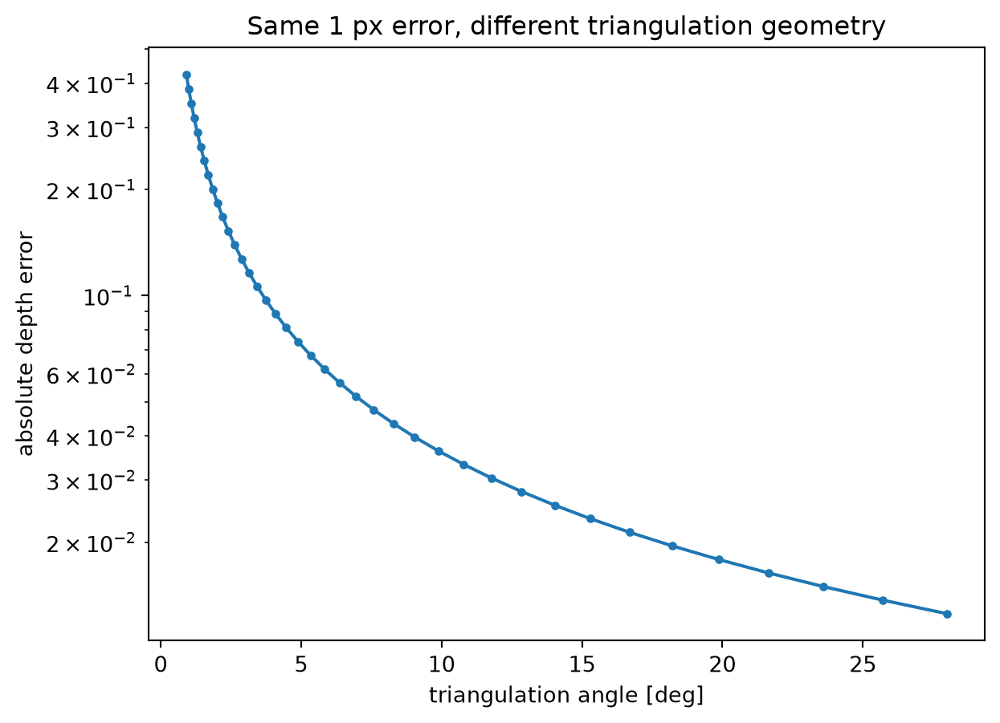

In [11]:
def triangulation_angle(C1,C2,X):
    d1=X-C1; d2=X-C2
    d1/=np.linalg.norm(d1); d2/=np.linalg.norm(d2)
    return np.degrees(np.arccos(np.clip(d1@d2,-1,1)))

baselines = np.geomspace(0.08, 2.5, 40)
angles, depth_errors = [], []
noise = np.array([1.0,0.0])/f_virtual

for b in baselines:
    C1b=np.array([-b/2,0,0]); C2b=np.array([b/2,0,0])
    P1b=np.c_[np.eye(3),-C1b]
    P2b=np.c_[np.eye(3),-C2b]
    xx1=project_normalized(P1b,Xtrue)
    xx2=project_normalized(P2b,Xtrue)+noise
    Xbh,_=triangulate_dlt(P1b,P2b,xx1,xx2)
    angles.append(triangulation_angle(C1b,C2b,Xtrue))
    depth_errors.append(abs(Xbh[2]-Xtrue[2]))

fig,ax=plt.subplots(figsize=(7,5))
ax.plot(angles,depth_errors,marker='o',ms=3)
ax.set_xlabel('triangulation angle [deg]')
ax.set_ylabel('absolute depth error')
ax.set_title('Same 1 px error, different triangulation geometry')
ax.set_yscale('log')
plt.show()


The plot is the controlled version of the usual stereo intuition: **depth is poorly constrained when the rays are nearly parallel**.

This is why triangulation should never be judged only by whether the linear system returns a number. The camera configuration determines how much that number can be trusted.


## Fixing the global scale

The calibrated two-view geometry has recovered a Euclidean shape, but the camera poses came from monocular SfM, so the whole reconstruction still carries one arbitrary global scale.

One physical length is enough to remove it. The long front edge of the Origami House is approximately

$$
\|X_1-X_0\|\simeq 5\;\text{cm}.
$$

If its reconstructed length is $\ell$, we multiply every reconstructed coordinate by

$$
s=\frac{5\;\text{cm}}{\ell}.
$$

After this single operation, all distances are expressed in centimetres.


reconstructed long edge = 0.8079 arbitrary units
scale                    = 6.1890 cm / unit
wall height X0-X4        = 2.22 cm
ridge height above X0    = 4.02 cm (in the house-attached frame)


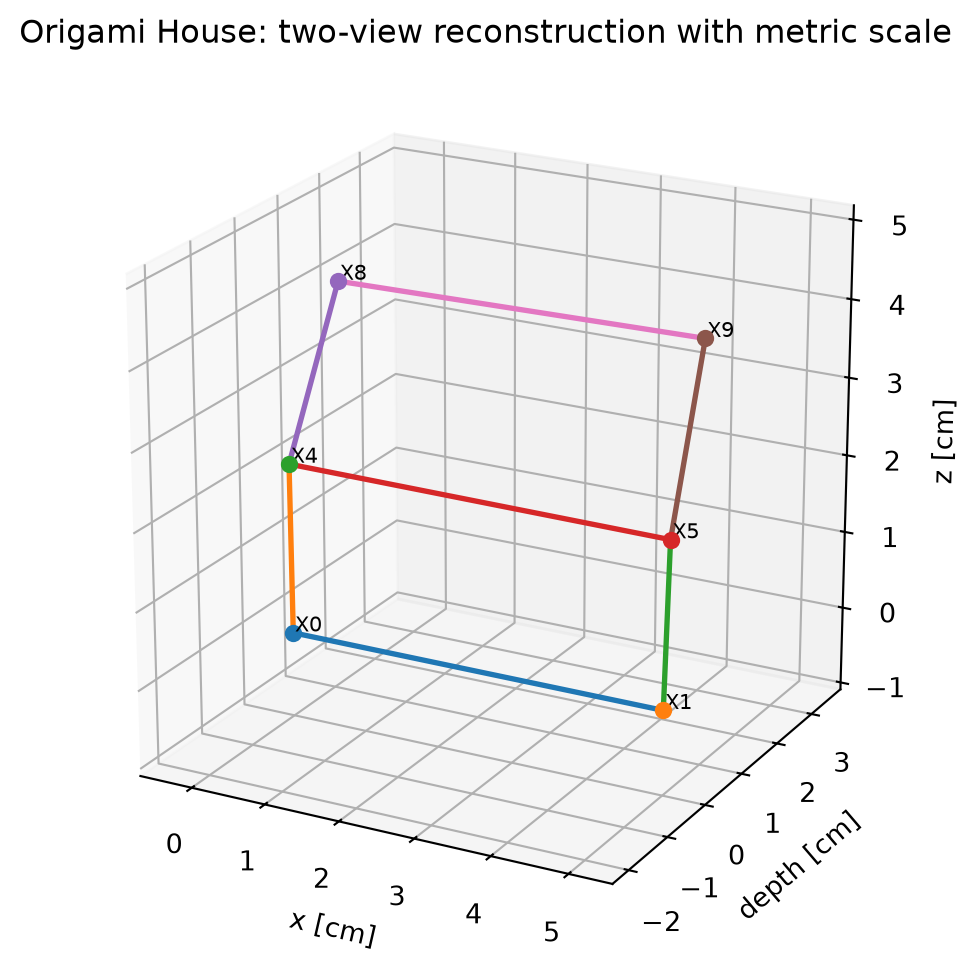

In [12]:
known_cm = data['known_length_cm']['length_cm']
reconstructed_long_edge = np.linalg.norm(X_house['X1']-X_house['X0'])
metric_scale = known_cm / reconstructed_long_edge
X_cm = {k: metric_scale*p for k,p in X_house.items()}

print(f'reconstructed long edge = {reconstructed_long_edge:.4f} arbitrary units')
print(f'scale                    = {metric_scale:.4f} cm / unit')
print(f'wall height X0-X4        = {np.linalg.norm(X_cm["X4"]-X_cm["X0"]):.2f} cm')
print(f'ridge height above X0    = {X_cm["X8"][2]:.2f} cm (in the house-attached frame)')

fig=plt.figure(figsize=(8,6))
ax=fig.add_subplot(111,projection='3d')
draw_reconstruction(ax,X_cm)
ax.set_xlabel('x [cm]'); ax.set_ylabel('depth [cm]'); ax.set_zlabel('z [cm]')
ax.set_title('Origami House: two-view reconstruction with metric scale')
ax.view_init(elev=21,azim=-62)
set_axes_equal(ax)
plt.show()


## Takeaways

Two-view triangulation is conceptually small but geometrically rich:

$$
\boxed{
\text{image point}
\rightarrow
\text{viewing ray}
\rightarrow
\text{two-view constraint}
\rightarrow
\text{3D point}
}
$$

The main lessons are:

- DLT eliminates the unknown projective depths and solves $A\widetilde{\mathbf M}=0$ by SVD;
- the 3D coordinates reconstructed by DLT inherit their geometry from the camera matrices;
- a simultaneous transformation $\widetilde M'=H\widetilde M$, $P'=PH^{-1}$ leaves every image unchanged;
- with noisy measurements the two rays generally do not intersect;
- midpoint triangulation, DLT, and reprojection-error minimization use different criteria;
- a small triangulation angle makes depth intrinsically unstable;
- a single known length fixes the remaining global scale.

The cameras were given throughout this notebook. The natural next question is where those cameras come from when only image correspondences are available.


## Exercises

### Exercise 1 — Why only two DLT equations per view?

The cross product

$$
\widetilde{\mathbf x}\times P\widetilde{\mathbf M}=0
$$

produces three scalar equations. Show that only two are linearly independent, and derive the two rows used in the implementation.

::: {.callout-tip collapse="true" title="Answer"}
The compact form is $[\widetilde{\mathbf x}]_\times P\widetilde M=0$. Since $[\widetilde{\mathbf x}]_\times$ is a $3\times3$ skew-symmetric matrix with nullspace $\operatorname{span}(\widetilde{\mathbf x})$, it has rank two for $\widetilde{\mathbf x}\neq0$. Therefore the three scalar rows contain only two independent constraints. Explicitly, if $P\widetilde M=(a,b,c)^\top$, the equations are $yc-b=0$, $a-xc=0$, and $xb-ya=0$, and the third is a linear combination of the first two. The same incidence constraint can be vectorized as $(\widetilde M^\top\otimes[\widetilde{\mathbf x}]_\times)\operatorname{vec}(P)=0$; in triangulation $P$ is known, so we instead solve the two independent rows for $\widetilde M$.
:::

### Exercise 2 — A projective change of 3D coordinates

Choose a different invertible $H$ and verify numerically that

$$
P_iH^{-1}(H\widetilde M)=P_i\widetilde M.
$$

What properties of the 3D house are preserved if $H$ is a general projectivity? What extra properties are preserved if $H$ is a similarity?

::: {.callout-tip collapse="true" title="Answer"}
A general projectivity preserves incidence: points on lines remain on lines, and planes map to planes. It does not in general preserve lengths, angles, parallelism, or ratios along a line. A similarity additionally preserves angles and all length ratios; it changes absolute lengths only by one global scale factor.
:::

### Exercise 3 — Midpoint versus DLT

Increase the synthetic image perturbation from $1$--$2$ pixels to $10$ pixels. Compare the 3D error and reprojection error of midpoint triangulation and DLT. Is one method always better according to both criteria?

::: {.callout-tip collapse="true" title="Answer"}
No. They optimize different quantities. Midpoint is tied to Euclidean distance between the two 3D rays, while DLT minimizes an algebraic residual. Either can have the smaller 3D or reprojection error in a particular configuration. Minimizing reprojection error is a separate nonlinear problem.
:::

### Exercise 4 — Baseline and depth uncertainty

In the controlled experiment, halve the triangulation angle while keeping the same one-pixel perturbation. What happens to the recovered depth? Why is this a geometric limitation rather than a failure of SVD?

::: {.callout-tip collapse="true" title="Answer"}
The depth becomes much more sensitive to the same image error. Nearly parallel rays can move a long distance along depth before their image projections change appreciably. SVD is only solving the supplied equations; the underlying geometry itself contains little depth information.
:::


---

**Luca Magri** — Computer Vision Dojo  
Code MIT · text and figures CC BY-NC-ND 4.0  
<https://magrilu.github.io/cv-dojo/>
